<div style="
    border: 3px solid #16a085;
    border-radius: 8px;
    background: linear-gradient(to right, rgba(22, 160, 133, 0.1), rgba(22, 160, 133, 0.05), transparent);
    padding: 15px;
    margin: 10px 0;
    font-size: 2em;
    font-weight: 1000;
    color: #16a085;
    text-align: center;
">
ICA Cocktail Party Problem
</div>

<div style="font-family: -apple-system, BlinkMacSystemFont, 'Segoe UI', Helvetica, Arial, sans-serif; margin: 20px auto;">
<details style="
    background-color: #ffffff;
    border: 1px solid #e1e4e8;
    border-radius: 12px;
    box-shadow: 0 3px 10px rgba(0,0,0,0.05);
    font-weight: 400
;
" open>
<summary style="
    font-size: 1.5rem;
    font-weight: 800;
    color: #6a0dad;
    padding: 1.25rem 1.5rem;
    cursor: pointer;
    outline: none;
    display: flex;
    align-items: center;
    transition: background-color 0.3s ease;
    user-select: none;
    list-style: none;
    background: linear-gradient(90deg, rgba(106,13,173,0.05), transparent);
">
<span style="margin-right: 10px;">✨</span> Independent Component Analysis (ICA)
</summary>

<div style="
    padding: 0 1.5rem 1.5rem;
    border-top: 1px solid rgba(106,13,173,0.1);
    font-size: 1.07rem;
    line-height: 1.7;
    color: #333;
">

<h2 style="
    color: #6a0dad;
    font-size: 1.3rem;
    margin-top: 1.5rem;
    margin-bottom: 1rem;
    display: flex;
    align-items: center;
">
<span style="margin-right: 10px;">🔮</span> Core Concept
</h2>
<p>
ICA is a <strong style="color: #6a0dad;">computational technique</strong> used in signal processing and data analysis to separate mixed signals into their original, individual parts — even when you don't know how the signals were mixed in the first place.
</p>

<h2 style="
    color: #6a0dad;
    font-size: 1.3rem;
    margin-top: 1.5rem;
    margin-bottom: 1rem;
    display: flex;
    align-items: center;
">

</div>

<div style="text-align: center;">
  <img src="https://raw.githubusercontent.com/AdittoAhosanKabbo/Dimension_Reduction/main/Independent_Component_Analysis%28ICA%29/Assets/ICA2.jpg" alt="ICA Diagram 2" width="900">
</div>


<table cellspacing="5" style="font-size:16px; margin-left:0; text-align:left;">
<tr>
<td style="background:#1abc9c;color:white;padding:12px 25px;border-radius:20px 0 0 20px;font-weight:700;font-size:1.7em;text-align:center">STEP 1</td>
<td style="padding:12px 25px;border-bottom:4px double #1abc9c;font-weight:700;font-size:1.8em;text-align:left">Import Required Libraries</td>
</tr>
</table>

In [45]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pydub import AudioSegment
import IPython

<div style="
    font-family: Arial, sans-serif;
    margin: 25px auto;
    padding: 25px;
    background-color: #f9f9f9;
    border-radius: 12px;
    border-left: 5px solid #16a085;
">

<p style="
    font-size: 1.8em;
    line-height: 1.7;
    color: #222;
    margin-top: 0;
    margin-bottom: 25px;
    font-weight: 400;
">
A classic analogy is the <strong style="color: #16a085; font-weight: 600;">"cocktail party problem,"</strong> where you have multiple microphones in a room with several people talking simultaneously. Each microphone records a different mixture of the speakers' voices. ICA can take these mixed recordings and separate them back into the individual voices.
</p>

<div style="
    margin-top: 30px;
    padding: 20px;
    background: rgba(22, 160, 133, 0.08);
    border-radius: 10px;
    border-left: 4px solid #16a085;
">
<p style="
    margin: 0;
    font-style: italic;
    color: #16a085;
    font-size: 1.5em;
    line-height: 1.6;
">
<strong style="font-weight: 600;">Key Insight:</strong> ICA achieves this by exploiting the statistical independence of the original source signals.
</p>
</div>

</div>



<table cellspacing="5" style="font-size:16px; margin-left:0; text-align:left;">
<tr>
<td style="background:#1abc9c;color:white;padding:12px 25px;border-radius:20px 0 0 20px;font-weight:700;font-size:1.7em;text-align:center">STEP 2</td>
<td style="padding:12px 25px;border-bottom:4px double #1abc9c;font-weight:700;font-size:1.8em;text-align:left">Load Mixed Audio Signals</td>
</tr>
</table>

In [2]:
import wave
mix_1_wave=wave.open('Mix1.wav', 'r')
mix_2_wave=wave.open('Mix2.wav', 'r')
mix_3_wave=wave.open('Mix3.wav', 'r')


<table cellspacing="5" style="font-size:16px; margin-left:0; text-align:left;">
<tr>
<td style="background:#1abc9c;color:white;padding:12px 25px;border-radius:20px 0 0 20px;font-weight:700;font-size:1.7em;text-align:center">STEP 3</td>
<td style="padding:12px 25px;border-bottom:4px double #1abc9c;font-weight:700;font-size:1.8em;text-align:left">Analyze Audio Properties</td>
</tr>
</table>

In [3]:
mix_1_wave.getparams()

_wave_params(nchannels=1, sampwidth=2, framerate=44100, nframes=486144, comptype='NONE', compname='not compressed')

nchannels=1 : Number of audio channels. The audio is mono (1 channel). If it were stereo, this value would be 2.
sampwidth=2 : Sample width in bytes. A value of 2 means each sample is represented by 16 bits (2 bytes).
framerate=44100 : Sampling rate (frames per second). This is a common rate for high-quality audio (e.g., CDs use 44.1 kHz).
nframes=264515 : Total number of audio frames (samples). This tells you how long the audio is.
comptype='NONE' : Compression type. 'NONE' means the audio is uncompressed .
compname='not compressed' : Compression name, confirming that the audio is not compressed.

So this file has only channel which means it's mono sound. It has a frame rate of 44100, which means each second of sound is represented by 44100 integers (integers because the file is in the common PCM 16-bit format). The file has a total of 264515 integers/frames, which means its length in seconds is:264515/44100 = 5.998072562358277

In [4]:
mix_1_wave.getframerate()

44100

In [5]:
mix_1_wave.getnframes()/mix_1_wave.getframerate()     #mix audio 1 duration in s

11.023673469387756

In [6]:
mix_2_wave.getnframes()/mix_2_wave.getframerate()     #mix audio 2 duration in s

11.023673469387756

In [7]:
mix_3_wave.getnframes()/mix_3_wave.getframerate()      #mix audio 3 duration in s

11.023673469387756



<table cellspacing="5" style="font-size:16px; margin-left:0; text-align:left;">
<tr>
<td style="background:#1abc9c;color:white;padding:12px 25px;border-radius:20px 0 0 20px;font-weight:700;font-size:1.7em;text-align:center">STEP 4</td>
<td style="padding:12px 25px;border-bottom:4px double #1abc9c;font-weight:700;font-size:1.8em;text-align:left">Data Preprocessing and Signal Extraction</td>
</tr>
</table>

In [8]:
# Extract Raw Audio from Wav File
#Use .readframes(-1) to extract raw audio data as a byte string.
# Convert the raw data to a NumPy array using np.frombuffer() with the appropriate data type (int16 for 16-bit audio).

signal_1_raw = mix_1_wave.readframes(-1)
signal_1 = np.frombuffer(signal_1_raw, dtype=np.int16)

signal_2_raw = mix_2_wave.readframes(-1)
signal_2 = np.frombuffer(signal_2_raw, dtype=np.int16)

signal_3_raw = mix_3_wave.readframes(-1)
signal_3 = np.frombuffer(signal_3_raw, dtype=np.int16)

In [9]:
max(signal_1), min(signal_1),len(signal_1)

(32767, -25068, 486144)

In [10]:
# Verify and normalize signals for better ICA performance
print(f"Original signal lengths: {len(signal_1)}, {len(signal_2)}, {len(signal_3)}")

# Ensure all signals have the same length
min_length = min(len(signal_1), len(signal_2), len(signal_3))
signal_1 = signal_1[:min_length]
signal_2 = signal_2[:min_length] 
signal_3 = signal_3[:min_length]

print(f"Trimmed signal lengths: {len(signal_1)}, {len(signal_2)}, {len(signal_3)}")



Original signal lengths: 486144, 486144, 486144
Trimmed signal lengths: 486144, 486144, 486144


In [11]:
fs1 = mix_1_wave.getframerate()
timing1 = np.linspace(0, len(signal_1)/fs1, num=len(signal_1))

fs2 = mix_2_wave.getframerate()
timing2 = np.linspace(0, len(signal_2)/fs2, num=len(signal_2))

fs3 = mix_3_wave.getframerate()
timing3 = np.linspace(0, len(signal_3)/fs3, num=len(signal_3))

In [12]:
# time_axis = np.linspace(
#     start=0,                      # Start time (seconds)
#     stop=len(signal) / fs,        # End time (total duration in seconds)
#     num=len(signal)               # Number of points = total number of samples
# )

In [13]:
fs1

44100

In [14]:
num=len(signal_1)
num

486144

In [15]:
len(signal_1)/fs1

11.023673469387756

In [16]:
timing1   ##numpy array contains 264515 data points

array([0.00000000e+00, 2.26757836e-05, 4.53515672e-05, ...,
       1.10236281e+01, 1.10236508e+01, 1.10236735e+01])

In [17]:
len(timing1)

486144

Parameters:

0: Start time (beginning of the audio).

len(signal_1)/fs1: End time (total duration in seconds).

len(signal_1) = Total number of samples.

len(signal_1)/fs1 = Duration (e.g., 264515 / 44100 ≈ 6 seconds).

num=len(signal_1): Number of points in the array (matches the number of samples).

Output:

timing1 is a 1D NumPy array like [0.0, 0.0000227, 0.0000454, ..., 5.999977].

Each value corresponds to the time (in seconds) of a sample in signal_1.

In [18]:
signal_1[:100]

array([  542,   802,   874,   930,   978,  1073,  1228,  1272,  1219,
        1258,  1375,  1463,  1512,  1530,  1562,  1670,  1776,  1802,
        1803,  1824,  1839,  1843,  1825,  1770,  1733,  1784,  1897,
        1986,  2050,  2133,  2198,  2220,  2275,  2378,  2452,  2488,
        2508,  2485,  2441,  2452,  2513,  2544,  2518,  2449,  2330,
        2182,  2095,  2094,  2082,  2002,  1868,  1688,  1500,  1368,
        1263,  1132,  1014,   939,   860,   724,   539,   393,   348,
         330,   253,   134,    17,   -79,  -120,  -118,  -153,  -225,
        -281,  -354,  -505,  -694,  -836,  -915,  -981, -1070, -1192,
       -1327, -1429, -1472, -1499, -1547, -1579, -1577, -1595, -1651,
       -1697, -1714, -1735, -1772, -1795, -1790, -1750, -1660, -1546,
       -1458], dtype=int16)

In [19]:
signal_1.dtype

dtype('int16')


<table cellspacing="5" style="font-size:16px; margin-left:0; text-align:left;">
<tr>
<td style="background:#1abc9c;color:white;padding:12px 25px;border-radius:20px 0 0 20px;font-weight:700;font-size:1.7em;text-align:center">STEP 5</td>
<td style="padding:12px 25px;border-bottom:4px double #1abc9c;font-weight:700;font-size:1.8em;text-align:left">Visualize Mixed Audio Signals</td>
</tr>
</table>

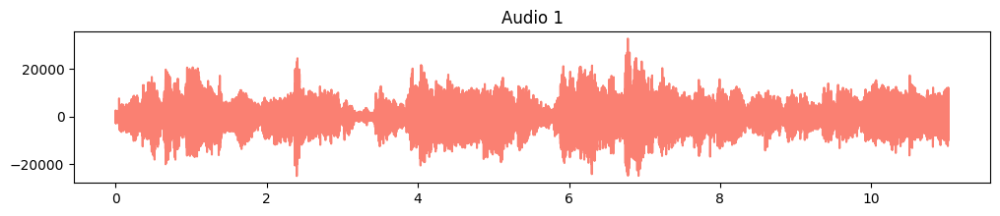

In [20]:
plt.figure(figsize=(12,2))
plt.title('Audio 1')
plt.plot(timing1,signal_1, c="salmon")
plt.show()

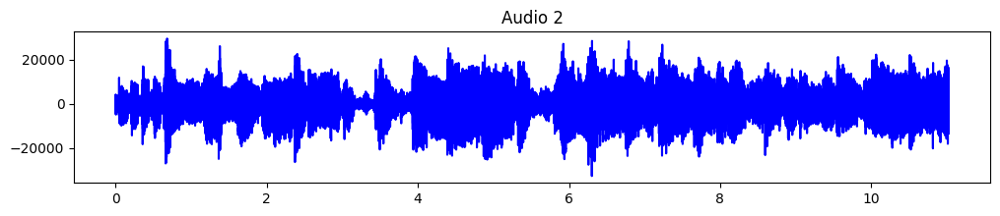

In [21]:


plt.figure(figsize=(12,2))
plt.title('Audio 2')
plt.plot(timing2,signal_2, c="blue")
plt.show()

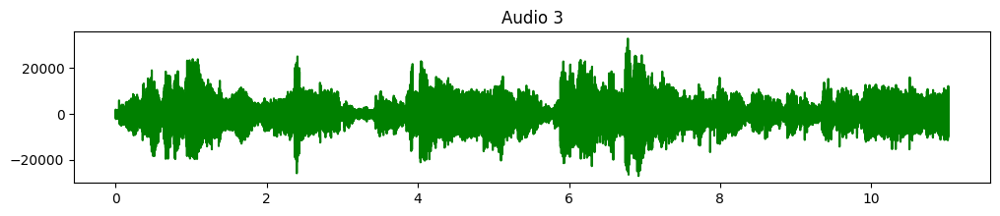

In [22]:


plt.figure(figsize=(12,2))
plt.title('Audio 3')
plt.plot(timing3,signal_3, c="green")
plt.show()

In [23]:
# Combine the normalized audio signals into a 2D NumPy array (X)
X = np.vstack((signal_1, signal_2, signal_3))

# Transpose the array so that each row corresponds to a time sample
X = X.T

<table cellspacing="5" style="font-size: 16px; margin-left: 0; text-align: left;">
<tr>
<td style="background:#3498db;color:white;padding:12px 25px;border-radius:20px;font-weight:700;font-size:1.4em;text-align:center">STEP 6</td>
<td style="padding:12px 25px;border-bottom:2px dashed #3498db;font-weight:600;font-size:1.6em;text-align:left">Apply Independent Component Analysis (ICA)</td>
</tr>
</table>

In [24]:
from sklearn.decomposition import FastICA

# Create an improved ICA model with better parameters
ica = FastICA(
    n_components=3, 
)

sources = ica.fit_transform(X)                     # Fit the model to the mixed signals
mixing_matrix = ica.mixing_                        # Get the mixing matrix

print(f"ICA converged in {ica.n_iter_} iterations")
print(f"Mixing matrix shape: {mixing_matrix.shape}")

ICA converged in 5 iterations
Mixing matrix shape: (3, 3)


In [25]:
# Let's split into separate signals and look at them
source_1 = sources[:, 0]
source_2 = sources[:, 1]
source_3 = sources[:, 2]

In [26]:
pd.DataFrame(sources).head()

,0,1,2
0,0.002387,0.164441,-0.000311
1,0.002563,0.242419,-0.000975
2,0.002695,0.264026,-0.001076
3,0.000627,0.281276,-0.002254
4,0.002515,0.295180,-0.001590


In [27]:
sources.shape

(486144, 3)

In [28]:
sources.dtype

dtype('float64')

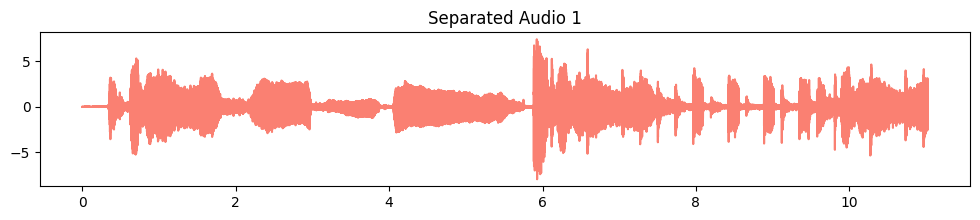

In [37]:
plt.figure(figsize=(12,2))
plt.title('Separated Audio 1')
plt.plot(timing1,source_1 , c="salmon")
plt.show()

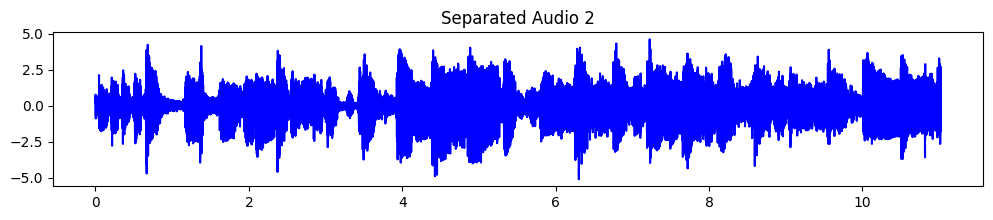

In [39]:
plt.figure(figsize=(12,2))
plt.title('Separated Audio 2')
plt.plot(timing1,source_2, c="blue")
plt.show()

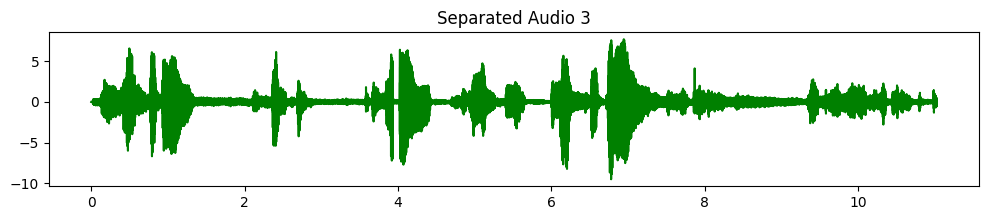

In [40]:
plt.figure(figsize=(12,2))
plt.title('Separated Audio 3')
plt.plot(timing1,source_3, c="green")
plt.show()

<table cellspacing="5" style="font-size: 16px; margin-left: 0; text-align: left;">
<tr>
<td style="background:#3498db;color:white;padding:12px 25px;border-radius:20px;font-weight:700;font-size:1.4em;text-align:center">STEP 7</td>
<td style="padding:12px 25px;border-bottom:2px dashed #3498db;font-weight:600;font-size:1.6em;text-align:left"> Process Separated Audio Signals</td>
</tr>
</table>

In [29]:
# Function to properly scale audio output
def scale_audio_output(source, target_max=0.8):
    """Scale audio to target maximum amplitude"""
    current_max = np.max(np.abs(source))
    if current_max > 0:
        scaled = source * (target_max / current_max)
    else:
        scaled = source
    return (scaled * 32767).astype(np.int16)

# Convert the separated audio signals to 16-bit signed integers with consistent scaling
result_source_1_int = scale_audio_output(source_1)
result_source_2_int = scale_audio_output(source_2)
result_source_3_int = scale_audio_output(source_3)

print("Audio signals scaled consistently for output")

Audio signals scaled consistently for output


In [30]:
from scipy.io import wavfile
# Writing wave files
wavfile.write("a.wav", fs1, result_source_1_int)
wavfile.write("b.wav", fs2, result_source_2_int)
wavfile.write("c.wav", fs3, result_source_3_int)

<table cellspacing="5" style="font-size: 16px; margin-left: 0; text-align: left;">
<tr>
<td style="background:#3498db;color:white;padding:12px 25px;border-radius:20px;font-weight:700;font-size:1.4em;text-align:center">STEP 8</td>
<td style="padding:12px 25px;border-bottom:2px dashed #3498db;font-weight:600;font-size:1.6em;text-align:left">Play Single Audio Files</td>
</tr>
</table>

In [31]:
IPython.display.Audio("ICA mix 1.wav")      #for separately playing audio mp3 or wav file

<table cellspacing="5" style="font-size: 16px; margin-left: 0; text-align: left;">
<tr>
<td style="background:#3498db;color:white;padding:12px 25px;border-radius:20px;font-weight:700;font-size:1.4em;text-align:center">STEP 9</td>
<td style="padding:12px 25px;border-bottom:2px dashed #3498db;font-weight:600;font-size:1.6em;text-align:left">🎧 Audio Playback and Comparison</td>
</tr>
</table>

In [32]:
from IPython.display import Audio, display

# List of audio file paths
audio_files = ['Mix1.wav', 'Mix2.wav', 'Mix3.wav']

# Display audio files vertically
for audio_file in audio_files:
    print(audio_file)
    display(Audio(audio_file))

Mix1.wav


Mix2.wav


Mix3.wav


In [33]:
# List of audio file paths
from IPython.display import Audio, display
audio_files = ['a.wav', 'b.wav', 'c.wav']

# Display audio files vertically
for audio_file in audio_files:
    print(audio_file)
    display(Audio(audio_file))

a.wav


b.wav


c.wav


<table cellspacing="5" style="font-size: 16px; margin-left: 0; text-align: left;">
<tr>
<td style="background:#3498db;color:white;padding:12px 25px;border-radius:20px;font-weight:700;font-size:1.4em;text-align:center">STEP 10</td>
<td style="padding:12px 25px;border-bottom:2px dashed #3498db;font-weight:600;font-size:1.6em;text-align:left"> Visualize ICA Results</td>
</tr>
</table>

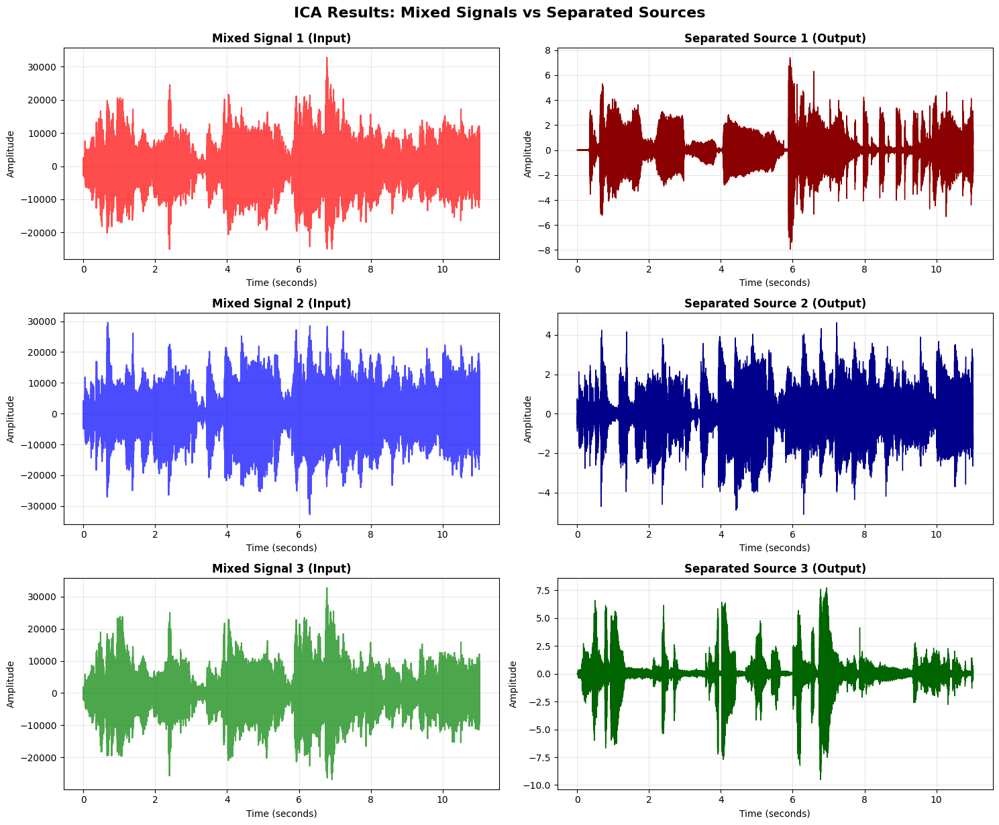

In [34]:
# Visualize the separation results
plt.figure(figsize=(15, 12))

# Create time axis for plotting
time_axis = np.linspace(0, len(source_1)/fs1, len(source_1))

# Plot original mixed signals
plt.subplot(3, 2, 1)
plt.plot(time_axis, signal_1, color='red', alpha=0.7)
plt.title('Mixed Signal 1 (Input)', fontsize=12, fontweight='bold')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')
plt.grid(True, alpha=0.3)

plt.subplot(3, 2, 3)
plt.plot(time_axis, signal_2, color='blue', alpha=0.7)
plt.title('Mixed Signal 2 (Input)', fontsize=12, fontweight='bold')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')
plt.grid(True, alpha=0.3)

plt.subplot(3, 2, 5)
plt.plot(time_axis, signal_3, color='green', alpha=0.7)
plt.title('Mixed Signal 3 (Input)', fontsize=12, fontweight='bold')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')
plt.grid(True, alpha=0.3)

# Plot separated sources
plt.subplot(3, 2, 2)
plt.plot(time_axis, source_1, color='darkred', linewidth=1)
plt.title('Separated Source 1 (Output)', fontsize=12, fontweight='bold')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')
plt.grid(True, alpha=0.3)

plt.subplot(3, 2, 4)
plt.plot(time_axis, source_2, color='darkblue', linewidth=1)
plt.title('Separated Source 2 (Output)', fontsize=12, fontweight='bold')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')
plt.grid(True, alpha=0.3)

plt.subplot(3, 2, 6)
plt.plot(time_axis, source_3, color='darkgreen', linewidth=1)
plt.title('Separated Source 3 (Output)', fontsize=12, fontweight='bold')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.suptitle('ICA Results: Mixed Signals vs Separated Sources', fontsize=16, fontweight='bold', y=1.02)
plt.show()

<table cellspacing="5" style="font-size:16px; margin-left:0; text-align:left">
<tr>
<td style="background:linear-gradient(135deg,#3498db,#2ecc71);color:white;padding:12px 25px;border-radius:20px;font-weight:700;font-size:1.4em;text-align:center">🎧 Audio Comparison:</td>
<td style="padding:12px 25px;border-bottom:2px dashed #3498db;font-weight:600;font-size:1.6em">Input vs Output (Direct Playback)</td>
</tr>
</table>

In [35]:
from IPython.display import Audio, display, HTML
import numpy as np

# Function to convert numpy array to audio for direct playback
def create_audio_from_array(audio_array, sample_rate, normalize=True):
    """Convert numpy array to Audio object for direct playback"""
    if normalize:
        # Normalize to prevent clipping
        if np.max(np.abs(audio_array)) > 0:
            audio_array = audio_array / np.max(np.abs(audio_array)) * 0.8
    
    # Convert to 16-bit integers for audio playback
    audio_int = (audio_array * 32767).astype(np.int16)
    return Audio(audio_int, rate=sample_rate)

print("🔄 SIDE-BY-SIDE COMPARISON")
print("="*50)

# Create pairs for comparison
comparisons = [
    ("Mixed Signal 1", signal_1, "Separated Source 1", source_1, fs1),
    ("Mixed Signal 2", signal_2, "Separated Source 2", source_2, fs2),
    ("Mixed Signal 3", signal_3, "Separated Source 3", source_3, fs3)
]

for i, (mix_name, mix_signal, sep_name, sep_signal, fs) in enumerate(comparisons, 1):
    print(f"\n🎵 Comparison {i}:")
    print(f"  📥 {mix_name}:")
    display(create_audio_from_array(mix_signal, fs))
    
    print(f"  📤 {sep_name}:")
    display(create_audio_from_array(sep_signal, fs))
    
    print("  " + "-"*30)

🔄 SIDE-BY-SIDE COMPARISON

🎵 Comparison 1:
  📥 Mixed Signal 1:


  📤 Separated Source 1:


  ------------------------------

🎵 Comparison 2:
  📥 Mixed Signal 2:


  📤 Separated Source 2:


  ------------------------------

🎵 Comparison 3:
  📥 Mixed Signal 3:


  📤 Separated Source 3:


  ------------------------------


<div style="text-align:center;margin:40px">
<h1 style="font-family:'UnifrakturMaguntia',cursive;font-size:3em;color:#8e44ad;padding:20px;display:inline-block;position:relative">
<span style="position:absolute;font-size:2.5em;left:-60px;top:5px">⚔</span>
END OF PROGRAM
<span style="position:absolute;font-size:2.5em;right:-60px;top:5px">🛡</span>
</h1>
</div>